#AVALIAÇÃO DE FATORES DE RISCO E ANALISE GEOESPACIAL DA LEISHMANIOSE TEGUMENTAR AMERICANA (LTA) NO BRASIL DE 2007-2022#

##Introdução##

A leishmaniose tegumentar americana (LTA) é uma zoonose causada por protozoários do complexo *Leishmania*. Essa doença ocorre quando flebotomíneos infectados, ao se alimentarem de sangue transmitem os parasitos para o hospedeiro. Um dos grandes impactos desta doença, é que ainda não possui cura. Sendo possível encontrar parasitos viáveis após anos desde a contaminação. Outro grande impacto, é que essa doença antigemente, conhecida como rural, está em processo de urbanização, indicando que nos próximos anos, poderemos ter uma quantidade de casos, mais elevadas.  

##Metodologia##
Foram coletados, dados do SINAN (Sistema de Informação de Agravos de Notificação) dos anos de 2007-2022 para entendimento dos fatores de risco e análise geoespacial através do tempo

Importando as bibliotecas necessárias

In [ ]:
!pip install libpysal

In [ ]:
!pip install esda

In [30]:
# Importações padrão da biblioteca
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import mannwhitneyu
from IPython.display import display, HTML

# Importações de terceiros
import seaborn as sns
import folium
import geopandas as gpd
import libpysal as lp
from libpysal.weights import Queen
import statsmodels.api as sm
import plotly.express as px
from matplotlib import colors as mcolors
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from folium.plugins import HeatMap, HeatMapWithTime
from folium import LinearColormap
from shapely.geometry import Point
from esda.moran import Moran_Local
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

In [4]:
df5 = pd.read_csv('leish.csv')
df5

,ano_diagnostico,cutanea,mucosa,Gravidez/Ign,1_trimestre,2_trimestre,3_trimestre,não,Masculino,Feminino,...,20-39,40-59,60-64,65-69,70-79,80+,caso_novo,Recidiva,clinico_laboratorial,clinico_epidemiologico
0,2007,21405,1489,731,28,73,15,3599,16877,6042,...,9499,5019,724,560,657,246,21787,876,19083,3837
1,2008,20285,1341,616,20,35,21,3523,15929,5868,...,8794,5033,662,535,627,231,20264,1119,18122,3678
2,2009,21809,1435,529,18,29,16,3917,16926,6321,...,9464,5366,751,598,681,262,21875,1088,19169,4079
3,2010,22304,1447,469,14,29,24,4418,16924,6850,...,9320,5507,824,571,709,315,22287,1114,19569,4205
4,2011,21563,1369,332,15,30,20,4466,16269,6666,...,9007,5281,801,582,726,285,21406,1177,18570,4366
5,2012,23749,1449,367,14,24,21,4582,18171,7022,...,9855,5805,852,626,679,306,23593,1257,21234,3967
6,2013,18478,1179,272,14,15,19,3342,14561,5095,...,8014,4536,690,499,664,266,18310,1003,16250,3408
7,2014,20774,1218,326,14,27,15,3788,16250,5741,...,8849,5356,788,526,712,282,20437,1144,18210,3782
8,2015,19407,1293,281,15,22,16,3686,15093,5606,...,7891,5334,850,659,746,290,19370,1014,17035,3668
9,2016,13009,935,169,8,14,8,2533,10142,3806,...,5274,3513,600,471,553,219,12954,791,11070,2878


In [5]:
# Imprimir os nomes das colunas de df5
print(df5.columns.tolist())

['ano_diagnostico', 'cutanea', 'mucosa', 'Gravidez/Ign', '1_trimestre', '2_trimestre', '3_trimestre', 'não', 'Masculino', 'Feminino', 'Branca', 'Preta', 'Amarela', 'Parda', 'Indigena', 'Escolaridade/Ign', 'Analfabeto', '1_4serie', '5_8serie', 'fundamental_completo', 'medio_incompleto', 'medio_completo', 'superior_incompleto', 'superior_completo', 'Cura', 'Abandono', 'obitolta', 'obito_outra', 'transferencia', 'mudanca_diagnostico', 'RO', 'AC', 'AM', 'RR', 'PA', 'AP', 'TO', 'MA', 'PI', 'CE', 'RN', 'PB', 'PE', 'AL', 'SE', 'BA', 'MG', 'ES', 'RJ', 'SP', 'PR', 'SC', 'RS', 'MS', 'MT', 'GO', 'DF', 'Urbana', 'Rural', 'Periurbana', 'Autoctone?/Ign', 'Sim', 'não_auto', 'Indeterminado', '<1 Ano', '1-4 anos', '5-9 anos', '10-14 anos', '15-19', '20-39', '40-59', '60-64', '65-69', '70-79', '80+', 'caso_novo', 'Recidiva', 'clinico_laboratorial', 'clinico_epidemiologico']


In [6]:
# Resumo Estatístico
resumo_estatistico = df5.describe()

# Exibir o resumo estatístico
print(resumo_estatistico)

       ano_diagnostico       cutanea       mucosa  Gravidez/Ign  1_trimestre  \
count        16.000000     16.000000    16.000000     16.000000    16.000000   
mean       2014.500000  18631.812500  1180.500000    330.875000    13.750000   
std           4.760952   3338.213958   226.199027    171.584722     6.038764   
min        2007.000000  12671.000000   829.000000    145.000000     3.000000   
25%        2010.750000  16441.250000   980.750000    206.250000     9.500000   
50%        2014.500000  18942.500000  1198.500000    276.500000    14.000000   
75%        2018.250000  21444.500000  1385.500000    392.500000    15.750000   
max        2022.000000  23749.000000  1489.000000    731.000000    28.000000   

       2_trimestre  3_trimestre          não     Masculino     Feminino  ...  \
count     16.00000    16.000000    16.000000     16.000000    16.000000  ...   
mean      25.81250    16.187500  3459.000000  14472.937500  5356.125000  ...   
std       14.27454     4.323868   671.6

In [7]:
# Verificar se há valores ausentes em cada coluna
valores_ausentes = df5.isna().any()

# Exibir as colunas com valores ausentes, se houver
if valores_ausentes.any():
    print("Colunas com valores ausentes:")
    print(valores_ausentes[valores_ausentes])
else:
    print("Não há valores ausentes no DataFrame.")


Não há valores ausentes no DataFrame.


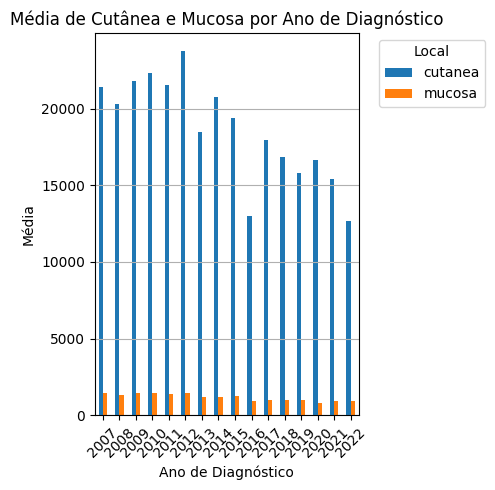

In [8]:
#AVALIAÇÃO DO NÚMERO DE CASOS PELA FORMA CLÍNICA DA INFECÇÃO
# Agrupar os dados por ano_diagnostico e calcular a média de cutanea e mucosa para cada ano
grupo_por_ano = df5.groupby('ano_diagnostico')[['cutanea', 'mucosa']].mean()

# Plotar o gráfico de barras
grupo_por_ano.plot(kind='bar', figsize=(5, 5))
plt.title('Média de Cutânea e Mucosa por Ano de Diagnóstico')
plt.xlabel('Ano de Diagnóstico')
plt.ylabel('Média')
plt.xticks(rotation=45)
plt.grid(axis='y')  # Adiciona linhas de grade apenas no eixo y
plt.legend(title='Local', bbox_to_anchor=(1.05, 1), loc='upper left')  # Adiciona a legenda fora do gráfico
plt.tight_layout()  # Ajusta o layout para evitar cortes nos rótulos
plt.show()


In [9]:
#AVALIAÇÃO DO NÚMERO DE CASOS PELA FORMA CLÍNICA DA INFECÇÃO

# Calcular a soma de casos de mucosa e cutânea
total_mucosa = df5['mucosa'].sum()
total_cutanea = df5['cutanea'].sum()

# Criar um DataFrame para os dados do gráfico
df_pizza = pd.DataFrame({'Tipo': ['Mucosa', 'Cutânea'], 'Total': [total_mucosa, total_cutanea]})

# Definir o tamanho da figura
width = 600
height = 600

# Criar o gráfico de pizza interativo com tamanho personalizado
fig = px.pie(df_pizza, values='Total', names='Tipo', title='Distribuição de casos de leishmaniose mucosa e cutânea', width=width, height=height)

# Exibir o gráfico
fig.show()


In [10]:
#ANÁLISE ESTATÍSTICA DAS FORMAS CLÍNICAS
# Filtrar os dados para remover valores ausentes
dados_filtrados = df5[['mucosa', 'cutanea']].dropna()

# Realizar o teste t de Student
t_statistic, p_value = stats.ttest_rel(dados_filtrados['mucosa'], dados_filtrados['cutanea'])

# Exibir o resultado do teste
print("Teste t-Student:")
print(f"   Estatística t: {t_statistic}")
print(f"   Valor p: {p_value}")

# Interpretar o resultado do teste
alpha = 0.05  # Nível de significância
if p_value < alpha:
    print("O valor p é menor que o nível de significância. Rejeitamos a hipótese nula.")
    print("Há evidências estatísticas de que há diferença significativa entre as médias de mucosa e cutânea.")
else:
    print("O valor p é maior que o nível de significância. Não rejeitamos a hipótese nula.")
    print("Não há evidências estatísticas suficientes para afirmar que há diferença significativa entre as médias de mucosa e cutânea.")


Teste t-Student:
   Estatística t: -22.263402587657833
   Valor p: 6.638451722704496e-13
O valor p é menor que o nível de significância. Rejeitamos a hipótese nula.
Há evidências estatísticas de que há diferença significativa entre as médias de mucosa e cutânea.


**Podemos observar que na maioria esmagadora dos casos os casos de infecção apresentam a forma cutânea da doença, onde há a presença de uma lesão, com formato característico. é importante lembrar que nesta lesão, é sempre possível encontrar os parasitos, mesmo após anos, não possuindo cura.**

In [11]:
#AVALIAÇÃO DOS CASOS EM FUNÇÃO DA ESCOLARIDADE
# Calcular o total de casos para cada categoria
total_analfabeto = df5['Analfabeto'].sum()
total_1_4serie = df5['1_4serie'].sum()
total_5_8serie = df5['5_8serie'].sum()
total_fundamental_completo = df5['fundamental_completo'].sum()
total_medio_incompleto = df5['medio_incompleto'].sum()
total_medio_completo = df5['medio_completo'].sum()
total_superior_incompleto = df5['superior_incompleto'].sum()
total_superior_completo = df5['superior_completo'].sum()

# Criar um DataFrame para os dados do gráfico
df_pizza = pd.DataFrame({
    'Nível de Educação': ['Analfabeto', '1ª a 4ª série', '5ª a 8ª série', 'Ensino Fundamental Completo',
                          'Ensino Médio Incompleto', 'Ensino Médio Completo', 'Ensino Superior Incompleto',
                          'Ensino Superior Completo'],
    'Total de Casos': [total_analfabeto, total_1_4serie, total_5_8serie, total_fundamental_completo,
                        total_medio_incompleto, total_medio_completo, total_superior_incompleto,
                        total_superior_completo]
})

# Criar o gráfico de pizza
fig = px.pie(df_pizza, values='Total de Casos', names='Nível de Educação', title='Distribuição dos casos por nível de educação')

# Exibir o gráfico
fig.show()



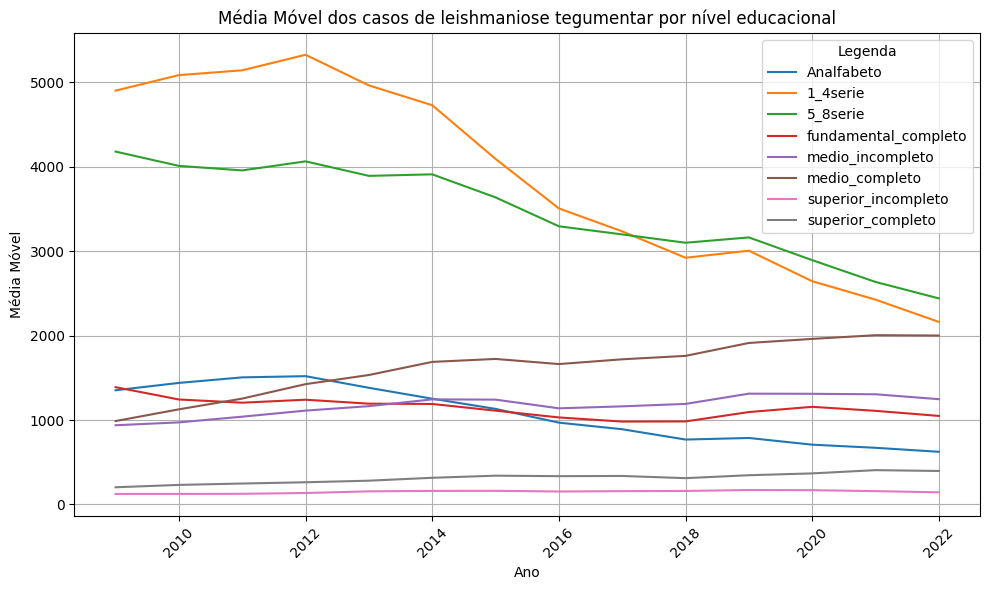

In [12]:
#ANÁLISE DE MÉDIA MÓVEL
# Calculando a média móvel com uma janela de tamanho 3
media_movel = df5[['Analfabeto', '1_4serie', '5_8serie', 'fundamental_completo', 'medio_incompleto', 'medio_completo', 'superior_incompleto', 'superior_completo']].rolling(window=3, axis=0).mean()

# Plotando o gráfico de linhas para a média móvel
plt.figure(figsize=(10, 6))
for column in media_movel.columns:
    plt.plot(df5['ano_diagnostico'], media_movel[column], label=column)

plt.title('Média Móvel dos casos de leishmaniose tegumentar por nível educacional')
plt.xlabel('Ano')
plt.ylabel('Média Móvel')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend(title='Legenda')
plt.tight_layout()
plt.show()

**As análises de média e média móvel revelaram que, a maior parte dos indivíduos que se infectam por LTA no Brasil (57%) possuem baixos níveis de escolaridade, não chegando a possuir ensino médio completo.**

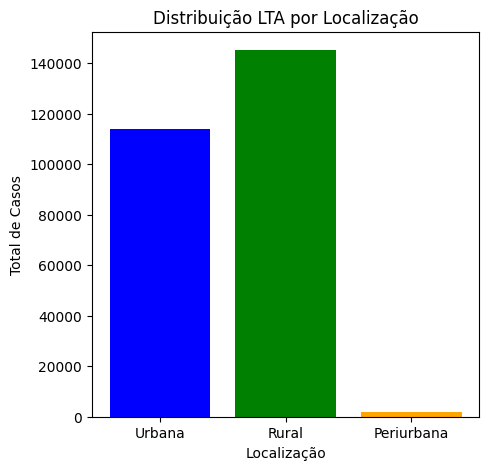

In [13]:
#ANALISANDO OS LOCAIS DE INFECÇÃO
# Substituir valores não numéricos por zero
df5['Urbana'] = pd.to_numeric(df5['Urbana'], errors='coerce').fillna(0)
df5['Rural'] = pd.to_numeric(df5['Rural'], errors='coerce').fillna(0)
df5['Periurbana'] = pd.to_numeric(df5['Periurbana'], errors='coerce').fillna(0)

# Convertendo os valores das colunas para inteiros
df5['Urbana'] = df5['Urbana'].astype(int)
df5['Rural'] = df5['Rural'].astype(int)
df5['Periurbana'] = df5['Periurbana'].astype(int)

# Preparar os dados para o gráfico de barras
localizacoes = ['Urbana', 'Rural', 'Periurbana']
total_casos = [df5['Urbana'].sum(), df5['Rural'].sum(), df5['Periurbana'].sum()]

# Criar o gráfico de barras
plt.figure(figsize=(5, 5))
plt.bar(localizacoes, total_casos, color=['blue', 'green', 'orange'])
plt.xlabel('Localização')
plt.ylabel('Total de Casos')
plt.title('Distribuição LTA por Localização')
plt.show()


In [14]:
# Converter as colunas para o tipo int64
df5['Urbana'] = pd.to_numeric(df5['Urbana'], errors='coerce')
df5['Rural'] = pd.to_numeric(df5['Rural'], errors='coerce')
df5['Periurbana'] = pd.to_numeric(df5['Periurbana'], errors='coerce')

# Verificar os tipos de variáveis após a conversão
tipos_variaveis_convertidas = df5[['Analfabeto', 'Urbana', 'Rural', 'Periurbana']].dtypes
print(tipos_variaveis_convertidas)


Analfabeto    int64
Urbana        int64
Rural         int64
Periurbana    int64
dtype: object


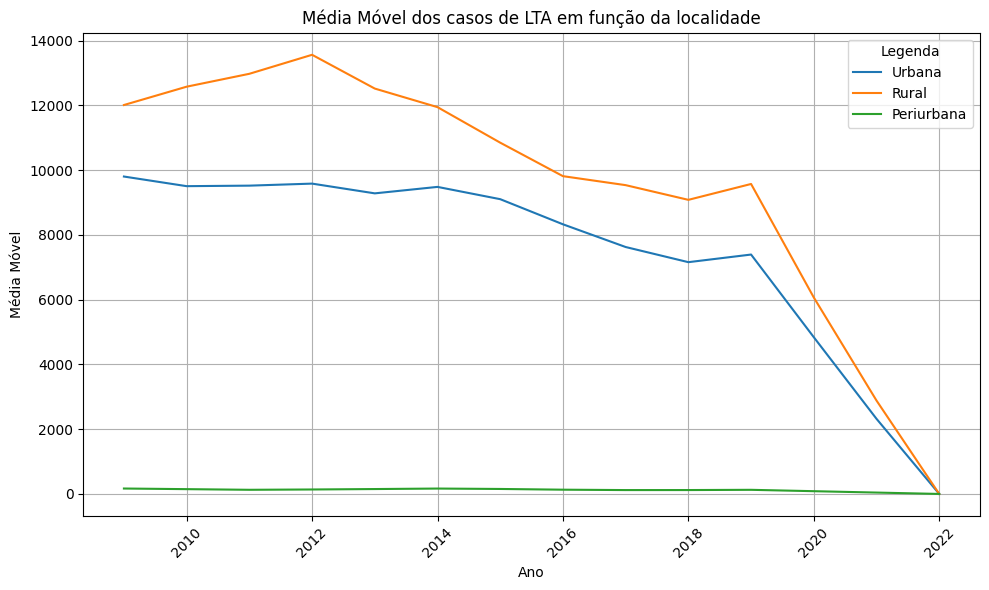

In [15]:
#ANÁLISE DE MÉDIA MÓVEL
# Calculando a média móvel com uma janela de tamanho 3
media_movel = df5[['Urbana', 'Rural', 'Periurbana']].rolling(window=3, axis=0).mean()

# Plotando o gráfico de linhas para a média móvel
plt.figure(figsize=(10, 6))
for column in media_movel.columns:
    plt.plot(df5['ano_diagnostico'], media_movel[column], label=column)

plt.title('Média Móvel dos casos de LTA em função da localidade')
plt.xlabel('Ano')
plt.ylabel('Média Móvel')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend(title='Legenda')
plt.tight_layout()
plt.show()

In [16]:
# Realizar o teste de Mann-Whitney entre 'Urbana' e 'Rural'
statistic_ur_r, p_ur_r = mannwhitneyu(df5['Urbana'], df5['Rural'])

# Realizar o teste de Mann-Whitney entre 'Urbana' e 'Periurbana'
statistic_ur_p, p_ur_p = mannwhitneyu(df5['Urbana'], df5['Periurbana'])

# Realizar o teste de Mann-Whitney entre 'Rural' e 'Periurbana'
statistic_r_p, p_r_p = mannwhitneyu(df5['Rural'], df5['Periurbana'])

print("Resultado do teste de Mann-Whitney entre 'Urbana' e 'Rural':")
print("Estatística de teste:", statistic_ur_r)
print("Valor p:", p_ur_r)

print("\nResultado do teste de Mann-Whitney entre 'Urbana' e 'Periurbana':")
print("Estatística de teste:", statistic_ur_p)
print("Valor p:", p_ur_p)

print("\nResultado do teste de Mann-Whitney entre 'Rural' e 'Periurbana':")
print("Estatística de teste:", statistic_r_p)
print("Valor p:", p_r_p)


Resultado do teste de Mann-Whitney entre 'Urbana' e 'Rural':
Estatística de teste: 67.5
Valor p: 0.023291240345525845

Resultado do teste de Mann-Whitney entre 'Urbana' e 'Periurbana':
Estatística de teste: 212.5
Valor p: 0.0014913283658950021

Resultado do teste de Mann-Whitney entre 'Rural' e 'Periurbana':
Estatística de teste: 212.5
Valor p: 0.0014913283658950021


**A maioria dos casos ainda ocorre na região rural, entretanto, os dados demonstram uma urbanizazação acelerada da doença, o que pode ser preocupante no futuro.**

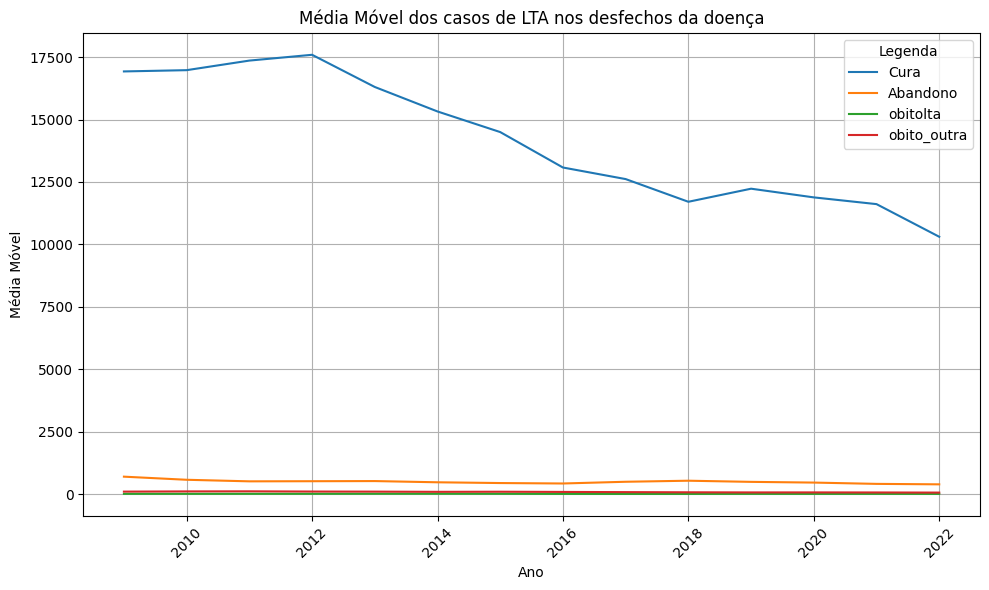

In [17]:
#ANÁLISE DE MÉDIA MÓVEL PARA O DESFECHO DA INFECÇÃO
# Calculando a média móvel com uma janela de tamanho 3
media_movel = df5[['Cura', 'Abandono', 'obitolta', 'obito_outra']].rolling(window=3, axis=0).mean()

# Plotando o gráfico de linhas para a média móvel
plt.figure(figsize=(10, 6))
for column in media_movel.columns:
    plt.plot(df5['ano_diagnostico'], media_movel[column], label=column)

plt.title('Média Móvel dos casos de LTA nos desfechos da doença')
plt.xlabel('Ano')
plt.ylabel('Média Móvel')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend(title='Legenda')
plt.tight_layout()
plt.show()

**Apesar de a maioria dos desfechos serem considerados como cura, é importante salientar que o tratamento quimioterápico, não promove a eliminação dos parasitos.**

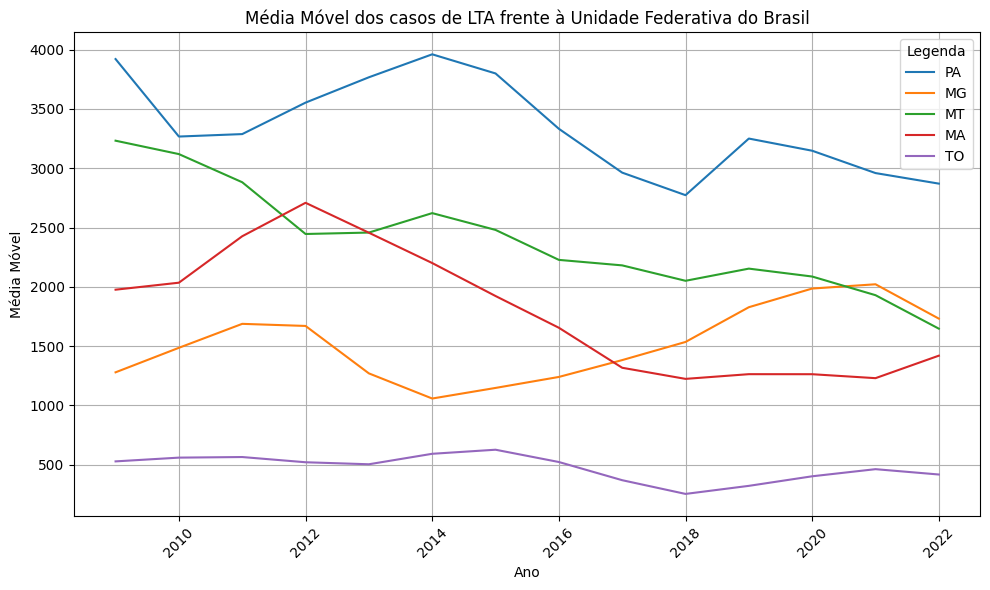

In [18]:
#ANÁLISE DE MÉDIA MÓVEL
# Calculando a média móvel com uma janela de tamanho 3
media_movel = df5[['PA', 'MG', 'MT', 'MA', 'TO']].rolling(window=3, axis=0).mean()

# Plotando o gráfico de linhas para a média móvel
plt.figure(figsize=(10, 6))
for column in media_movel.columns:
    plt.plot(df5['ano_diagnostico'], media_movel[column], label=column)

plt.title('Média Móvel dos casos de LTA frente à Unidade Federativa do Brasil')
plt.xlabel('Ano')
plt.ylabel('Média Móvel')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend(title='Legenda')
plt.tight_layout()
plt.show()

**Os estados do Pará, Mato Grosso, Maranhão e Minas Gerais concentram a maior quantidade de casos. O estado do Tocantins, começou a apresentar mais recentemente casos de LTA, o que pode justificar esta diferença discrepante.**

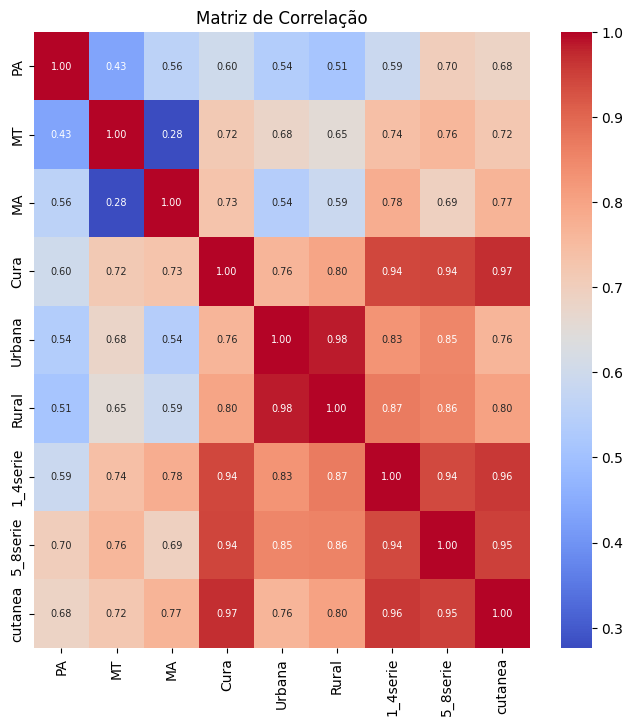

In [19]:
#MODELO DE MATRIZ DE CORRELAÇÃO

# Selecionando as colunas desejadas
colunas_selecionadas = ['PA', 'MT', 'MA', 'Cura', 'Urbana', 'Rural', '1_4serie', '5_8serie','cutanea']

# Criando um novo DataFrame com as colunas selecionadas
df_selected = df5[colunas_selecionadas]

# Calculando a matriz de correlação
matriz_correlacao = df_selected.corr()

# Plotando a matriz de correlação como um gráfico de calor
plt.figure(figsize=(8, 8))
sns.heatmap(matriz_correlacao, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 7})
plt.title('Matriz de Correlação')
plt.show()

In [20]:
#PREPARAÇÃO DOS DADOS PARA O MODELO DE CORRELAÇÃO MÚLTIPLA
# Selecionar as variáveis desejadas do DataFrame df5
dados = df5[['PA', 'MT', 'MA', 'Cura', 'Urbana', 'Rural', '1_4serie', '5_8serie', 'cutanea']]

# Remover linhas com valores NaN
dados = dados.dropna()

# Exibir as primeiras linhas do DataFrame
print(dados.head())


     PA    MT    MA   Cura  Urbana  Rural  1_4serie  5_8serie  cutanea
0  4514  2900  2437  17516   10376  11716      4723      4531    21405
1  3800  2672  1759  16142    9118  11877      4805      3932    20285
2  3449  4126  1733  17114    9917  12445      5179      4078    21809
3  2554  2561  2614  17668    9484  13414      5274      4023    22304
4  3862  1960  2934  17292    9166  13072      4977      3771    21563


In [21]:
# Criando uma coluna chamada soma, para comportar dados da soma de leishmaniose cutanea e mucosa, para fazer os modelos de regressão
df5['soma'] = None
df5

,ano_diagnostico,cutanea,mucosa,Gravidez/Ign,1_trimestre,2_trimestre,3_trimestre,não,Masculino,Feminino,...,40-59,60-64,65-69,70-79,80+,caso_novo,Recidiva,clinico_laboratorial,clinico_epidemiologico,soma
0,2007,21405,1489,731,28,73,15,3599,16877,6042,...,5019,724,560,657,246,21787,876,19083,3837,None
1,2008,20285,1341,616,20,35,21,3523,15929,5868,...,5033,662,535,627,231,20264,1119,18122,3678,None
2,2009,21809,1435,529,18,29,16,3917,16926,6321,...,5366,751,598,681,262,21875,1088,19169,4079,None
3,2010,22304,1447,469,14,29,24,4418,16924,6850,...,5507,824,571,709,315,22287,1114,19569,4205,None
4,2011,21563,1369,332,15,30,20,4466,16269,6666,...,5281,801,582,726,285,21406,1177,18570,4366,None
5,2012,23749,1449,367,14,24,21,4582,18171,7022,...,5805,852,626,679,306,23593,1257,21234,3967,None
6,2013,18478,1179,272,14,15,19,3342,14561,5095,...,4536,690,499,664,266,18310,1003,16250,3408,None
7,2014,20774,1218,326,14,27,15,3788,16250,5741,...,5356,788,526,712,282,20437,1144,18210,3782,None
8,2015,19407,1293,281,15,22,16,3686,15093,5606,...,5334,850,659,746,290,19370,1014,17035,3668,None
9,2016,13009,935,169,8,14,8,2533,10142,3806,...,3513,600,471,553,219,12954,791,11070,2878,None


In [22]:
# Criar a coluna 'soma' como a soma das colunas 'cutanea' e 'mucosa'
df5['soma'] = df5['cutanea'] + df5['mucosa']

# Exibir o DataFrame resultante
print(df5)


    ano_diagnostico  cutanea  mucosa  Gravidez/Ign  1_trimestre  2_trimestre  \
0              2007    21405    1489           731           28           73   
1              2008    20285    1341           616           20           35   
2              2009    21809    1435           529           18           29   
3              2010    22304    1447           469           14           29   
4              2011    21563    1369           332           15           30   
5              2012    23749    1449           367           14           24   
6              2013    18478    1179           272           14           15   
7              2014    20774    1218           326           14           27   
8              2015    19407    1293           281           15           22   
9              2016    13009     935           169            8           14   
10             2017    17939    1013           192           20           27   
11             2018    16870     987    

In [23]:
# Verificar o tipo de dados das colunas especificadas
colunas = ['PA', 'MT', 'MA', 'Cura', 'Urbana', 'Rural', '1_4serie', '5_8serie', 'cutanea', 'soma']
tipos = df5[colunas].dtypes

# Exibir os tipos de dados
print(tipos)


PA          int64
MT          int64
MA          int64
Cura        int64
Urbana      int64
Rural       int64
1_4serie    int64
5_8serie    int64
cutanea     int64
soma        int64
dtype: object


In [24]:
# Substituir '-' por 0 nas colunas 'Cura' e 'Urbana'
df5['Cura'] = df5['Cura'].replace('-', '0')
df5['Urbana'] = df5['Urbana'].replace('-', '0')
df5['Rural'] = df5['Rural'].replace('-', '0')


# Converter as colunas 'Cura' e 'Urbana' para o tipo int
df5['Cura'] = df5['Cura'].astype(int)
df5['Urbana'] = df5['Urbana'].astype(int)
df5['Rural'] = df5['Rural'].astype(int)

# Verificar se a conversão foi bem-sucedida
print(df5.dtypes)
print(df5[['Cura', 'Urbana']])


ano_diagnostico           int64
cutanea                   int64
mucosa                    int64
Gravidez/Ign              int64
1_trimestre               int64
                          ...  
caso_novo                 int64
Recidiva                  int64
clinico_laboratorial      int64
clinico_epidemiologico    int64
soma                      int64
Length: 80, dtype: object
     Cura  Urbana
0   17516   10376
1   16142    9118
2   17114    9917
3   17668    9484
4   17292    9166
5   17810   10105
6   13803    8581
7   14352    9765
8   15335    8967
9    9548    6254
10  12963    7659
11  12610    7563
12  11118    6960
13  11920       0
14  11801       0
15   7198       0


In [25]:
#Modelo de Correlação Múltipla
# Definir variáveis independentes (dados) e variável dependente (y)
dados = df5[['PA', 'MT', 'MA', 'Cura', 'Urbana', 'Rural', '1_4serie', '5_8serie', 'cutanea', 'soma']].dropna()
y = df5['soma'].loc[dados.index]  # Ajustar o índice de y para coincidir com os dados

# Adicionando uma constante aos dados
dados = sm.add_constant(dados)

# Criando o modelo de regressão
modelo = sm.OLS(y, dados)

# Ajustando o modelo aos dados
resultado = modelo.fit()

# Calculando os odds ratios
odds_ratios = pd.DataFrame(np.exp(resultado.params), columns=['Odds Ratio'])
odds_ratios['p-value'] = resultado.pvalues
print("\nOdds Ratios:")
print(odds_ratios)

# Imprimindo um resumo do modelo
print(resultado.summary())


Odds Ratios:
          Odds Ratio       p-value
const       1.000000  9.988628e-01
PA          1.000000  9.929445e-01
MT          1.000000  9.917111e-01
MA          1.000000  9.948832e-01
Cura        1.000000  9.896166e-01
Urbana      1.000000  9.861762e-01
Rural       1.000000  9.927893e-01
1_4serie    1.000000  9.965514e-01
5_8serie    1.000000  9.970613e-01
cutanea     1.000000  9.960267e-01
soma        2.718282  3.756631e-57
                            OLS Regression Results                            
Dep. Variable:                   soma   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 7.342e+25
Date:                Tue, 16 Jul 2024   Prob (F-statistic):           8.98e-65
Time:                        22:41:02   Log-Likelihood:                 329.06
No. Observations:                  16   AIC:                            -636.1
Df Residuals:

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1806: UserWarning:

kurtosistest only valid for n>=20 ... continuing anyway, n=16



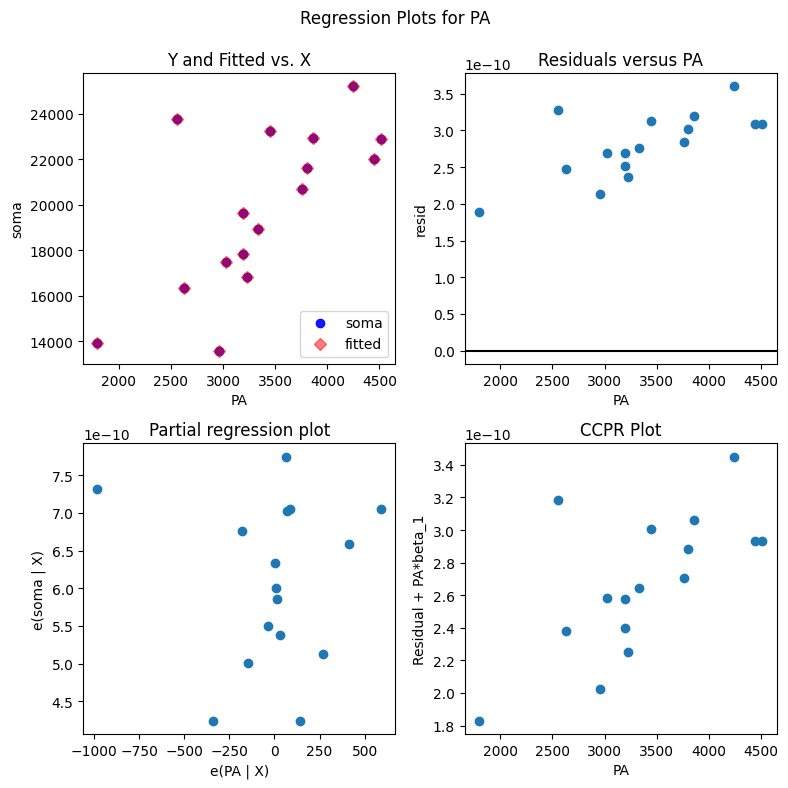

In [26]:
# Plotar os resíduos em relação às variáveis explicativas
sm.graphics.plot_regress_exog(resultado, 'PA', fig=plt.figure(figsize=(8, 8)))
plt.show()


**Os modelos de matriz de correlação e correlação múltipla, demonstram que as variáveis 'PA', 'MT', 'MA', 'Cura', 'Urbana', 'Rural', '1_4serie', '5_8serie','cutanea' demonstram correlações entre sí. Apresentando um R quadrado de 1.**

Mean Squared Error: 1253230.153225


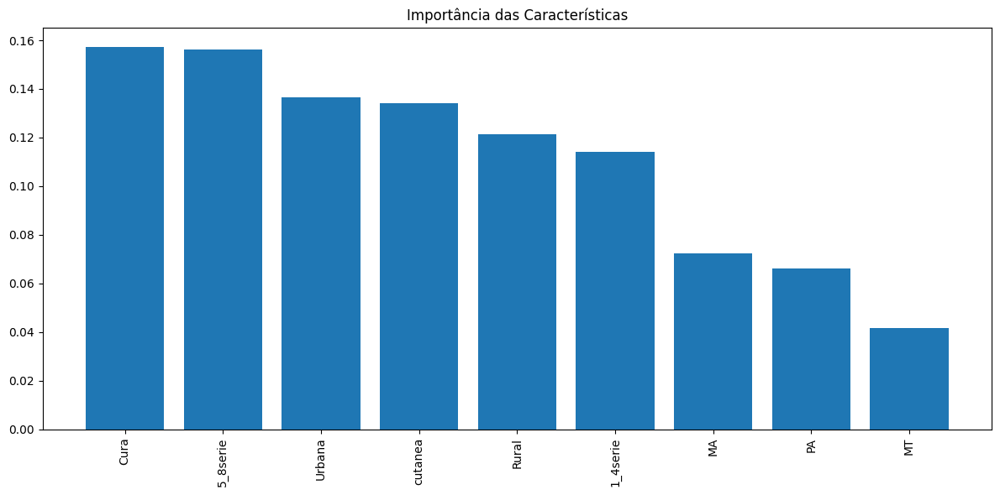

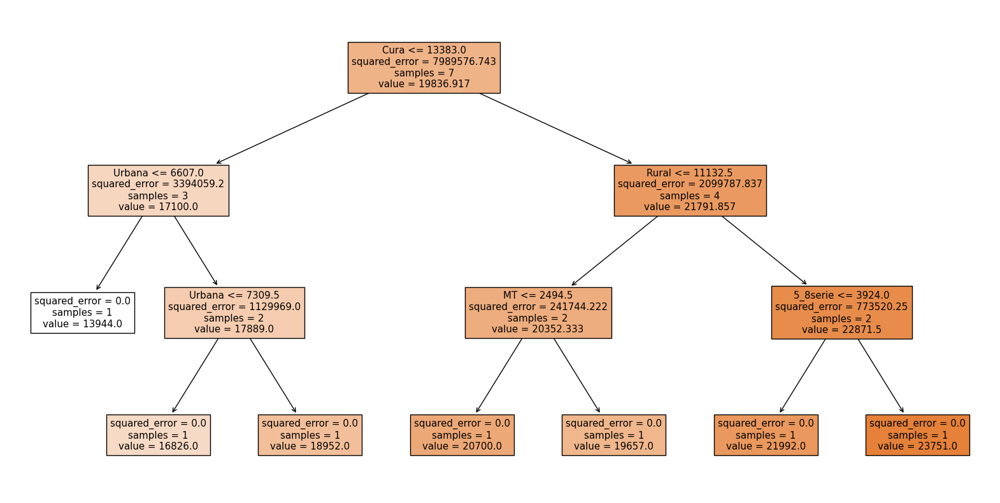

In [27]:
#CONFIRMAÇÃO DO MODELO POR ÁRVORE DE REGRESSÃO E AVALIAÇÃO DA IMPORTÂNCIA DE CADA VARIÁVEL PARA O MODELO
# Selecionando apenas as colunas desejadas
df5_subset = df5[['PA', 'MT', 'MA', 'Cura', 'Urbana', 'Rural', '1_4serie', '5_8serie', 'cutanea', 'soma']]

# Separando os dados em features (X) e target (y)
X = df5_subset.drop('soma', axis=1)  # Features
y = df5_subset['soma']  # Target

# Dividindo os dados em conjunto de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Criando o modelo de Random Forest regressor
model = RandomForestRegressor(n_estimators=100, random_state=42)

# Treinando o modelo
model.fit(X_train, y_train)

# Fazendo previsões no conjunto de teste
predictions = model.predict(X_test)

# Avaliando o modelo
mse = mean_squared_error(y_test, predictions)
print('Mean Squared Error:', mse)

# Visualizando a importância das características
importances = model.feature_importances_
feature_names = X.columns
indices = importances.argsort()[::-1]

plt.figure(figsize=(12, 6))
plt.title('Importância das Características')
plt.bar(range(X.shape[1]), importances[indices], align='center')
plt.xticks(range(X.shape[1]), feature_names[indices], rotation=90)
plt.tight_layout()
plt.show()

# Import the plot_tree function
from sklearn.tree import plot_tree

# Visualizar uma das árvores do modelo (por exemplo, a primeira árvore)
tree_index = 0
plt.figure(figsize=(20, 10))
plot_tree(model.estimators_[tree_index], feature_names=X.columns, filled=True) # Now you can use plot_tree
plt.show()

In [31]:
#AVALIAÇÃO DO ERRO QUADRÁTICO MÉDIO E R QUADRADO
# Fazendo previsões no conjunto de teste
predictions = model.predict(X_test)

# Calculando o Mean Squared Error (MSE)
mse = mean_squared_error(y_test, predictions)
print('Mean Squared Error (MSE):', mse)

# Calculando o R-squared (R²)
r_squared = r2_score(y_test, predictions)
print('R-squared (R²):', r_squared)


Mean Squared Error (MSE): 1253230.153225
R-squared (R²): 0.8811728737671424


**Podemos observar que o modelo de árvore de regressão confirma a relação entre as variáveis, apresentando um R quadrado de 0.88. Também é possível observar que o desfecho e escolaridade, tem grande importância no modelo.**

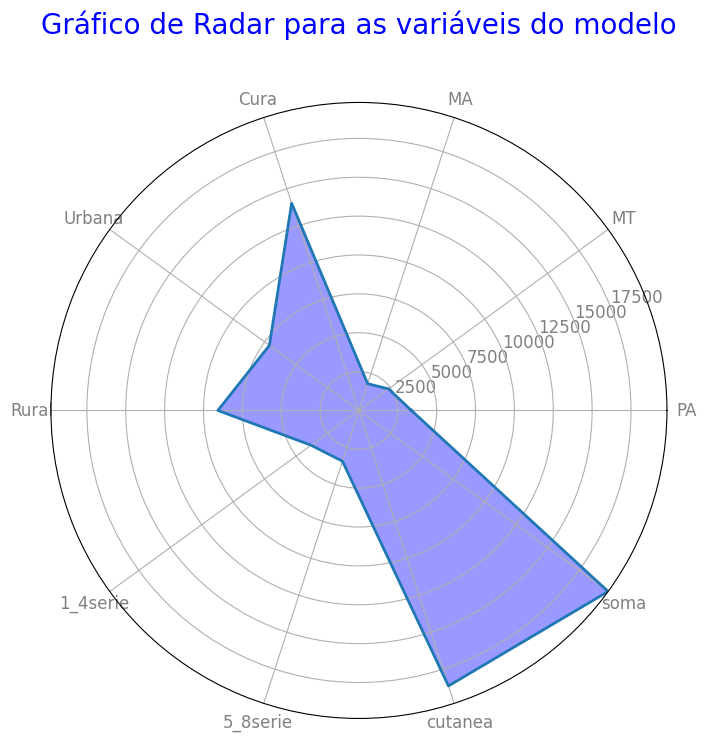

In [32]:
#GRÁFICO DE RADAR DAS VARIÁVEIS
df5_subset = df5[['PA', 'MT', 'MA', 'Cura', 'Urbana', 'Rural', '1_4serie', '5_8serie', 'cutanea', 'soma']]

# Calculando a média de cada variável para o gráfico de radar
mean_values = df5_subset.mean()

# Número de variáveis
categories = list(mean_values.index)
N = len(categories)

# O que cada eixo vai representar
values = mean_values.values.flatten().tolist()
values += values[:1]  # para que o gráfico feche

# Ângulos dos eixos
angles = [n / float(N) * 2 * np.pi for n in range(N)]
angles += angles[:1]

# Inicializar o plot
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

# Desenhar uma linha ao redor do gráfico
ax.plot(angles, values, linewidth=2, linestyle='solid')

# Preencher o gráfico
ax.fill(angles, values, color='b', alpha=0.4)

# Adicionar os rótulos para cada eixo
plt.xticks(angles[:-1], categories, color='grey', size=12)

# Adicionar uma legenda
plt.yticks(color='grey', size=12)
plt.ylim(0, max(values))

# Título do gráfico
plt.title('Gráfico de Radar para as variáveis do modelo', size=20, color='blue', y=1.1)

plt.show()


##Análise Espacial de LTA no Brasil##

In [33]:
df1 = pd.read_csv('leish_esp.csv')
df1

,municipio,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,110001 Alta Floresta D'Oeste,21,28,14,34,9,21,26,37,22,24,21,19,20,22,19,12
1,110037 Alto Alegre dos Parecis,6,9,2,20,13,16,26,34,36,28,25,19,9,13,3,4
2,110040 Alto Paraíso,13,11,9,2,9,6,11,5,12,13,10,10,8,6,5,14
3,110034 Alvorada D'Oeste,15,17,7,6,3,5,17,10,11,10,9,4,4,4,4,1
4,110002 Ariquemes,51,61,78,49,30,47,56,39,51,49,61,43,33,21,30,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4092,522230 Vila Propício,1,2,2,9,-,1,-,-,-,1,2,3,6,2,2,2
4093,520550 Colinas de Goiás (transf. p/TO),-,-,-,1,-,-,-,-,-,-,-,-,-,-,-,-
4094,520000 Município ignorado - GO,-,1,-,-,-,-,-,-,-,-,-,-,-,-,-,-
4095,530010 Brasília,40,25,35,68,44,39,22,39,47,36,40,34,25,46,37,38


Como os valores de geocodigos de municípios estão incompletos, foi necessário carregar uma nova base de dados, do IBGE, para futura obtenção dos valores de latitude e longitude para análise espacial.

##Preparando os dados##

Neste trecho, os dados serão preparados para iniciar a análise geoespacial dos casos de LTA no Brasil, para isso, é importante ter os dados de latitude, longitude e geocodigo de cada município que apresentou casos dessa infecção

In [34]:
# 1. Carregar a base de dados do IBGE
# Exemplo:
df_ibge = pd.read_csv('geocodigos.csv', encoding='latin1')

# 2. Atualizar a coluna 'geocodigo' do DataFrame df1 com os valores da coluna 'geocodigos_ibge' do DataFrame df_ibge
df1['geocodigo'] = df_ibge['geocodigos_ibge']

# Exibindo o DataFrame atualizado
print(df1)




                                  municipio  2007 2008 2009 2010 2011 2012  \
0               110001 Alta Floresta D'Oeste   21   28   14   34    9   21   
1             110037 Alto Alegre dos Parecis    6    9    2   20   13   16   
2                        110040 Alto Paraíso   13   11    9    2    9    6   
3                    110034 Alvorada D'Oeste   15   17    7    6    3    5   
4                           110002 Ariquemes   51   61   78   49   30   47   
...                                      ...  ...  ...  ...  ...  ...  ...   
4092                    522230 Vila Propício    1    2    2    9    -    1   
4093  520550 Colinas de Goiás (transf. p/TO)    -    -    -    1    -    -   
4094          520000 Município ignorado - GO    -    1    -    -    -    -   
4095                         530010 Brasília   40   25   35   68   44   39   
4096                                          NaN  NaN  NaN  NaN  NaN  NaN   

     2013 2014 2015 2016 2017 2018 2019 2020 2021 2022  geocodi

In [35]:
# Criando as colunas de latitude e longitude vazias
df1['lat_neg'] = pd.Series(dtype=float)
df1['long_neg'] = pd.Series(dtype=float)
df1

,municipio,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,geocodigo,lat_neg,long_neg
0,110001 Alta Floresta D'Oeste,21,28,14,34,9,21,26,37,22,24,21,19,20,22,19,12,1100015,NaN,NaN
1,110037 Alto Alegre dos Parecis,6,9,2,20,13,16,26,34,36,28,25,19,9,13,3,4,1100379,NaN,NaN
2,110040 Alto Paraíso,13,11,9,2,9,6,11,5,12,13,10,10,8,6,5,14,1100403,NaN,NaN
3,110034 Alvorada D'Oeste,15,17,7,6,3,5,17,10,11,10,9,4,4,4,4,1,1100346,NaN,NaN
4,110002 Ariquemes,51,61,78,49,30,47,56,39,51,49,61,43,33,21,30,18,1100023,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4092,522230 Vila Propício,1,2,2,9,-,1,-,-,-,1,2,3,6,2,2,2,4112900,NaN,NaN
4093,520550 Colinas de Goiás (transf. p/TO),-,-,-,1,-,-,-,-,-,-,-,-,-,-,-,-,4112959,NaN,NaN
4094,520000 Município ignorado - GO,-,1,-,-,-,-,-,-,-,-,-,-,-,-,-,-,4113007,NaN,NaN
4095,530010 Brasília,40,25,35,68,44,39,22,39,47,36,40,34,25,46,37,38,4113106,NaN,NaN


In [36]:
# Carregando a planilha com os dados de latitude e longitude
df = pd.read_csv('municipios.csv')
df

,codigo_ibge,nome,latitude,longitude,capital,codigo_uf,siafi_id,ddd,fuso_horario
0,5200050,Abadia de Goiás,-16.75730,-49.4412,0,52,1050,62,America/Sao_Paulo
1,3100104,Abadia dos Dourados,-18.48310,-47.3916,0,31,4001,34,America/Sao_Paulo
2,5200100,Abadiânia,-16.19700,-48.7057,0,52,9201,62,America/Sao_Paulo
3,3100203,Abaeté,-19.15510,-45.4444,0,31,4003,37,America/Sao_Paulo
4,1500107,Abaetetuba,-1.72183,-48.8788,0,15,401,91,America/Sao_Paulo
...,...,...,...,...,...,...,...,...,...
5565,2933604,Xique-Xique,-10.82300,-42.7245,0,29,3971,74,America/Sao_Paulo
5566,2517407,Zabelê,-8.07901,-37.1057,0,25,542,83,America/Sao_Paulo
5567,3557154,Zacarias,-21.05060,-50.0552,0,35,2973,18,America/Sao_Paulo
5568,2114007,Zé Doca,-3.27014,-45.6553,0,21,1287,98,America/Sao_Paulo


In [37]:
# Renomeando a coluna 'codigo_ibge' para 'geocodigo' para facilitar o merge
df.rename(columns={'codigo_ibge': 'geocodigo'}, inplace=True)

# Combinando os DataFrames com base nos valores da coluna 'geocodigo'
df_merged = pd.merge(df1, df[['geocodigo', 'latitude', 'longitude']], how='left', on='geocodigo')

# Copiando as informações de latitude e longitude para as colunas 'lat_neg' e 'long_neg' de df1
df_merged['lat_neg'] = df_merged['latitude']
df_merged['long_neg'] = df_merged['longitude']

# Exibindo o DataFrame resultante
print(df_merged)

                                  municipio  2007 2008 2009 2010 2011 2012  \
0               110001 Alta Floresta D'Oeste   21   28   14   34    9   21   
1             110037 Alto Alegre dos Parecis    6    9    2   20   13   16   
2                        110040 Alto Paraíso   13   11    9    2    9    6   
3                    110034 Alvorada D'Oeste   15   17    7    6    3    5   
4                           110002 Ariquemes   51   61   78   49   30   47   
...                                      ...  ...  ...  ...  ...  ...  ...   
4092                    522230 Vila Propício    1    2    2    9    -    1   
4093  520550 Colinas de Goiás (transf. p/TO)    -    -    -    1    -    -   
4094          520000 Município ignorado - GO    -    1    -    -    -    -   
4095                         530010 Brasília   40   25   35   68   44   39   
4096                                          NaN  NaN  NaN  NaN  NaN  NaN   

     2013 2014 2015  ... 2018 2019 2020 2021 2022 geocodigo   l

In [38]:
# Verificando a contagem de valores ausentes em cada coluna de df_merged
missing_values = df_merged.isna().sum()

# Exibindo a contagem de valores ausentes
print(missing_values)

municipio     0
2007          1
2008          1
2009          1
2010          1
2011          1
2012          1
2013          1
2014          1
2015          1
2016          1
2017          1
2018          1
2019          1
2020          1
2021          1
2022          1
geocodigo     0
lat_neg       0
long_neg      0
latitude      0
longitude     0
dtype: int64


In [39]:
# Excluindo as linhas que contêm valores ausentes
df2 = df_merged.dropna()

# Renomeando o DataFrame para df2
df2 = df2.reset_index(drop=True)

# Exibindo as primeiras linhas do DataFrame df2
print(df2.head())


                       municipio  2007 2008 2009 2010 2011 2012 2013 2014  \
0    110001 Alta Floresta D'Oeste   21   28   14   34    9   21   26   37   
1  110037 Alto Alegre dos Parecis    6    9    2   20   13   16   26   34   
2             110040 Alto Paraíso   13   11    9    2    9    6   11    5   
3         110034 Alvorada D'Oeste   15   17    7    6    3    5   17   10   
4                110002 Ariquemes   51   61   78   49   30   47   56   39   

  2015  ... 2018 2019 2020 2021 2022 geocodigo   lat_neg  long_neg  latitude  \
0   22  ...   19   20   22   19   12   1100015 -11.92830  -61.9953 -11.92830   
1   36  ...   19    9   13    3    4   1100379 -12.13200  -61.8350 -12.13200   
2   12  ...   10    8    6    5   14   1100403  -9.71429  -63.3188  -9.71429   
3   11  ...    4    4    4    4    1   1100346 -11.34630  -62.2847 -11.34630   
4   51  ...   43   33   21   30   18   1100023  -9.90571  -63.0325  -9.90571   

   longitude  
0   -61.9953  
1   -61.8350  
2   -63.318

In [40]:
df2

,municipio,2007,2008,2009,2010,2011,2012,2013,2014,2015,...,2018,2019,2020,2021,2022,geocodigo,lat_neg,long_neg,latitude,longitude
0,110001 Alta Floresta D'Oeste,21,28,14,34,9,21,26,37,22,...,19,20,22,19,12,1100015,-11.92830,-61.9953,-11.92830,-61.9953
1,110037 Alto Alegre dos Parecis,6,9,2,20,13,16,26,34,36,...,19,9,13,3,4,1100379,-12.13200,-61.8350,-12.13200,-61.8350
2,110040 Alto Paraíso,13,11,9,2,9,6,11,5,12,...,10,8,6,5,14,1100403,-9.71429,-63.3188,-9.71429,-63.3188
3,110034 Alvorada D'Oeste,15,17,7,6,3,5,17,10,11,...,4,4,4,4,1,1100346,-11.34630,-62.2847,-11.34630,-62.2847
4,110002 Ariquemes,51,61,78,49,30,47,56,39,51,...,43,33,21,30,18,1100023,-9.90571,-63.0325,-9.90571,-63.0325
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4091,522205 Vicentinópolis,-,-,-,-,-,-,-,2,-,...,-,-,-,-,-,4112801,-23.49870,-49.9090,-23.49870,-49.9090
4092,522230 Vila Propício,1,2,2,9,-,1,-,-,-,...,3,6,2,2,2,4112900,-23.43570,-50.2496,-23.43570,-50.2496
4093,520550 Colinas de Goiás (transf. p/TO),-,-,-,1,-,-,-,-,-,...,-,-,-,-,-,4112959,-24.42090,-52.8413,-24.42090,-52.8413
4094,520000 Município ignorado - GO,-,1,-,-,-,-,-,-,-,...,-,-,-,-,-,4113007,-23.62190,-52.4693,-23.62190,-52.4693


In [41]:
#Converter - em 0 para facilitar as analises espaciais
# Lista dos anos desejados
anos = ['2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022']

# Loop para percorrer cada ano
for ano in anos:
    # Substituir "-" por 0 na coluna correspondente
    df2[ano] = df2[ano].replace('-', '0')

# Exibir as primeiras linhas do DataFrame para verificar a substituição
print(df2.head())


                       municipio  2007 2008 2009 2010 2011 2012 2013 2014  \
0    110001 Alta Floresta D'Oeste   21   28   14   34    9   21   26   37   
1  110037 Alto Alegre dos Parecis    6    9    2   20   13   16   26   34   
2             110040 Alto Paraíso   13   11    9    2    9    6   11    5   
3         110034 Alvorada D'Oeste   15   17    7    6    3    5   17   10   
4                110002 Ariquemes   51   61   78   49   30   47   56   39   

  2015  ... 2018 2019 2020 2021 2022 geocodigo   lat_neg  long_neg  latitude  \
0   22  ...   19   20   22   19   12   1100015 -11.92830  -61.9953 -11.92830   
1   36  ...   19    9   13    3    4   1100379 -12.13200  -61.8350 -12.13200   
2   12  ...   10    8    6    5   14   1100403  -9.71429  -63.3188  -9.71429   
3   11  ...    4    4    4    4    1   1100346 -11.34630  -62.2847 -11.34630   
4   51  ...   43   33   21   30   18   1100023  -9.90571  -63.0325  -9.90571   

   longitude  
0   -61.9953  
1   -61.8350  
2   -63.318

In [42]:
# Verificando valores ausentes em df
missing_values = df2.isna().sum()

# Exibindo o número de valores ausentes em cada coluna
print(missing_values)


municipio     0
2007          0
2008          0
2009          0
2010          0
2011          0
2012          0
2013          0
2014          0
2015          0
2016          0
2017          0
2018          0
2019          0
2020          0
2021          0
2022          0
geocodigo     0
lat_neg       0
long_neg      0
latitude      0
longitude     0
dtype: int64


In [43]:
#CALCULANDO O GEOMETRY PARA ANALISE ESPACIAL

# Criando uma nova coluna chamada 'geometry' para armazenar os objetos de geometria
df2['geometry'] = None

# Itere sobre as linhas do DataFrame
for index, row in df2.iterrows():
    # Extrai os valores de latitude e longitude
    latitude = row['lat_neg']
    longitude = row['long_neg']
    # Crie um objeto de geometria do tipo Point
    geometry = Point(longitude, latitude)
    # Atribua o objeto de geometria à coluna 'geometry'
    df2.at[index, 'geometry'] = geometry

# Exiba o DataFrame resultante
print(df2)

                                  municipio  2007 2008 2009 2010 2011 2012  \
0               110001 Alta Floresta D'Oeste   21   28   14   34    9   21   
1             110037 Alto Alegre dos Parecis    6    9    2   20   13   16   
2                        110040 Alto Paraíso   13   11    9    2    9    6   
3                    110034 Alvorada D'Oeste   15   17    7    6    3    5   
4                           110002 Ariquemes   51   61   78   49   30   47   
...                                      ...  ...  ...  ...  ...  ...  ...   
4091                   522205 Vicentinópolis    0    0    0    0    0    0   
4092                    522230 Vila Propício    1    2    2    9    0    1   
4093  520550 Colinas de Goiás (transf. p/TO)    0    0    0    1    0    0   
4094          520000 Município ignorado - GO    0    1    0    0    0    0   
4095                         530010 Brasília   40   25   35   68   44   39   

     2013 2014 2015  ... 2019 2020 2021 2022 geocodigo   lat_ne

**Para análise espacial inicial, começaremos com a densidade de Kernel, para ver a distribuição dos casos de LTA no Brasil de 2007-2022.**

In [44]:
#AVALIAÇÃO DA DENSIDADE DE KERNEL
from sklearn.neighbors import KernelDensity

# Lista dos anos desejados
anos = ['2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022']

# Bandwidth para o cálculo da densidade de kernel
bandwidth = 0.05

# Loop para calcular a densidade de kernel para cada ano
for ano in anos:
    # Extrair os valores da coluna do ano atual
    valores = df2[ano].values.reshape(-1, 1)

    # Criar um objeto KernelDensity
    kde = KernelDensity(bandwidth=bandwidth, kernel='gaussian')

    # Ajustar o modelo de densidade de kernel aos dados
    kde.fit(valores)

    # Calcular a densidade de kernel para os valores
    densidades = np.exp(kde.score_samples(valores))

    # Adicionar os valores de densidade de kernel como uma nova coluna no DataFrame
    df2[f'kernel_{ano}'] = densidades

# Exibir as primeiras linhas do DataFrame para verificar as novas colunas
print(df2.head())



                       municipio  2007 2008 2009 2010 2011 2012 2013 2014  \
0    110001 Alta Floresta D'Oeste   21   28   14   34    9   21   26   37   
1  110037 Alto Alegre dos Parecis    6    9    2   20   13   16   26   34   
2             110040 Alto Paraíso   13   11    9    2    9    6   11    5   
3         110034 Alvorada D'Oeste   15   17    7    6    3    5   17   10   
4                110002 Ariquemes   51   61   78   49   30   47   56   39   

  2015  ... kernel_2013 kernel_2014 kernel_2015 kernel_2016 kernel_2017  \
0   22  ...    0.025323    0.005844    0.011688    0.007792    0.019480   
1   36  ...    0.025323    0.003896    0.009740    0.013636    0.021428   
2   12  ...    0.077918    0.146097    0.056491    0.035063    0.050647   
3   11  ...    0.015584    0.058439    0.066231    0.056491    0.091554   
4   51  ...    0.005844    0.011688    0.007792    0.007792    0.003896   

  kernel_2018 kernel_2019  kernel_2020  kernel_2021  kernel_2022  
0    0.025323    0.

In [45]:
#MAPA DENSIDADE DE KERNELL
# Lista dos anos desejados
anos = ['2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022']

# Loop para criar mapas de densidade de kernel sequenciais para cada ano
for ano in anos:
    # Filtrar o DataFrame para o ano atual
    df_ano = df2[['lat_neg', 'long_neg', f'kernel_{ano}']]

    # Verificar se há valores NaN
    if df_ano.isnull().values.any():
        print(f'Atenção: Valores NaN encontrados para o ano {ano}')
        continue  # Pule este ano e vá para o próximo

    # Verificar se há coordenadas ausentes
    if df_ano[['lat_neg', 'long_neg']].isnull().values.any():
        print(f'Atenção: Coordenadas ausentes para o ano {ano}')
        continue  # Pule este ano e vá para o próximo

    # Verificar se há valores de densidade ausentes
    if df_ano[f'kernel_{ano}'].isnull().values.any():
        print(f'Atenção: Valores de densidade ausentes para o ano {ano}')
        continue  # Pule este ano e vá para o próximo

    # Crie o título com o ano
    titulo = f'Mapa de Densidade de Kernel - {ano}'

    # Crie o mapa centrado no Brasil
    m = folium.Map(location=[-14.235, -51.925], zoom_start=4)

    # Criando uma lista de coordenadas (lat_neg, long_neg, densidade) ponderadas com base nos valores de kernel
    heat_data = df_ano[['lat_neg', 'long_neg', f'kernel_{ano}']].values.tolist()

    # Defina o valor de opacidade mínimo (ajuste conforme necessário)
    min_opacity = 0.4  # Experimente diferentes valores para controlar a opacidade

    # Defina o raio do mapa de calor (em pixels)
    radius = 10  # Experimente diferentes valores para controlar o tamanho do raio

    # Crie o mapa de calor com controle de opacidade e tamanho do raio
    HeatMap(heat_data, radius=radius, min_opacity=min_opacity).add_to(m)

    # Crie uma escala de cores de intensidade de verde a vermelho
    colormap = LinearColormap(colors=['green', 'yellow', 'red'], vmin=min(df_ano[f'kernel_{ano}']), vmax=max(df_ano[f'kernel_{ano}']))
    colormap.caption = 'Escala de Cores: Verde (Menos Intenso) - Amarelo - Vermelho (Mais Intenso)'
    colormap.add_to(m)

    # Use o método display para exibir o mapa no notebook
    display(HTML(f'<h3>{titulo}</h3>'))
    display(m)




In [46]:
#MAPA DE KERNELL INTERATIVO DOS CASOS DE LTA NO BRASIL DE 2007-2022
# Lista de anos desejados
anos = ['2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022']

# Criar uma lista de dados para cada ano
data = []
for ano in anos:
    # Extrair os valores de densidade de Kernel para o ano atual
    kernel_density_coluna = f'kernel_{ano}'

    # Normalizar os valores de densidade de Kernel para suavizar a visualização
    max_density = df2[kernel_density_coluna].max()
    min_density = df2[kernel_density_coluna].min()
    normalized_heat_data = [[row['lat_neg'], row['long_neg'], (row[kernel_density_coluna] - min_density) / (max_density - min_density)] for idx, row in df2.iterrows()]

    # Adicionar os dados normalizados para o ano atual à lista de dados
    data.append(normalized_heat_data)

# Criar o mapa centrado no Brasil
m = folium.Map(location=[-14.235, -51.925], zoom_start=4)

# Criar o título da animação
titulo = 'Evolução da Densidade de Kernel (2007-2022)'

# Criar a animação HeatMapWithTime
HeatMapWithTime(
    data,
    index=anos,
    auto_play=True,
    radius=7,  # Ajuste do raio para suavização
    min_opacity=0.1,  # Ajuste da opacidade mínima para suavização
    gradient={0.0: 'blue', 0.2: 'lime', 0.4: 'yellow', 0.6: 'orange', 1.0: 'red'},  # Gradiente de cores ajustado
    name=titulo
).add_to(m)

# Use o método display para exibir o mapa no notebook
display(m)



**Podemos observar que LTA esta presente em quase todas as unidades federativas, em especial no sudeste e nordeste. É interessante observar que, ao longo do tempo, podemos ver o surgimento de áreas focais da doença ao longo do território nacional, demonstrando, o quão rápido está o espalhamento da doença.**

**Entretanto, a análise de Kernel não é a mais indicada para confirmar a presença de hot spots, uma vez que ele não faz comparações robustas entre uma localidade e seus vizinhos. Por esse motivo, realizamos uma análise de índice de moran local, esta análise faz análises comparativas robustas entre um ponto e seus vizinhos, sendo mais sensível para determinar a presença de hot spots.**

In [47]:
#CONVERTENDO OS VALORES DAS COLUNAS PARA FLOAT, PARA CALCULAR O INDICE DE MORAN LOCAL
# Lista de colunas de 2007 a 2022
colunas = [str(ano) for ano in range(2007, 2023)]

# Converter os dados das colunas para float
df2[colunas] = df2[colunas].astype(float)

# Verificar a conversão
print(df2.dtypes)


municipio       object
2007           float64
2008           float64
2009           float64
2010           float64
2011           float64
2012           float64
2013           float64
2014           float64
2015           float64
2016           float64
2017           float64
2018           float64
2019           float64
2020           float64
2021           float64
2022           float64
geocodigo        int64
lat_neg        float64
long_neg       float64
latitude       float64
longitude      float64
geometry        object
kernel_2007    float64
kernel_2008    float64
kernel_2009    float64
kernel_2010    float64
kernel_2011    float64
kernel_2012    float64
kernel_2013    float64
kernel_2014    float64
kernel_2015    float64
kernel_2016    float64
kernel_2017    float64
kernel_2018    float64
kernel_2019    float64
kernel_2020    float64
kernel_2021    float64
kernel_2022    float64
dtype: object


In [52]:
# CALCULO INDICE DE MORAN LOCAL

# Lista de colunas de 2007 a 2022
colunas = [str(ano) for ano in range(2007, 2023)]

# Para cada coluna, calcular o índice de Moran local e salvar os resultados
for coluna in colunas:
    # Extrair variável de interesse da coluna atual
    variavel_interesse = df2[coluna].values

    # Construir matriz de pesos de vizinhança queen
    matriz_pesos = Queen.from_dataframe(df2)

    # Calcular o índice de Moran local
    moran_local = Moran_Local(variavel_interesse, matriz_pesos)

    # Adicionar os resultados ao DataFrame com nomes prefixados com "m_"
    df2[f'm_{coluna}_Moran_Local_Index'] = moran_local.Is
    df2[f'm_{coluna}_Moran_Local_P_Value'] = moran_local.p_sim

# Visualizar os resultados
print(df2.filter(like='m_'))



<ipython-input-52-4b96971c733e>:24: FutureWarning:

`use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning

<ipython-input-52-4b96971c733e>:24: FutureWarning:

`use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning

<ipython-input-52-4b96971c733e>:24: FutureWarning:

`use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning

<ipython-input-52-4b96971c733e>:24: FutureWarning:

`use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning

<ipython-input-52-4b96971c733e>:24: FutureWarning:

`use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning

<ipython-input-52-4b96971c733e>:24:

      m_2007_Moran_Local_Index  m_2007_Moran_Local_P_Value  \
0                     0.160294                       0.146   
1                     0.006633                       0.107   
2                     0.393897                       0.010   
3                     0.008594                       0.278   
4                     0.709285                       0.099   
...                        ...                         ...   
4091                  0.043538                       0.363   
4092                  0.038665                       0.247   
4093                  0.053141                       0.173   
4094                  0.047004                       0.187   
4095                 -0.232605                       0.403   

      m_2008_Moran_Local_Index  m_2008_Moran_Local_P_Value  \
0                     0.262303                       0.121   
1                     0.049215                       0.118   
2                     0.445159                       0.010   
3      

In [53]:
#MAPA DE DISTRIBUÍÇÃO DE LTA POR ÍNDICE DE MORAN LOCAL
# Lista de anos desejados
anos = ['2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022']

# Definindo a opacidade mínima para o mapa de calor
min_opacity = 0.3  # Ajuste conforme necessário

# Loop para criar mapas sequenciais para cada ano
for ano in anos:
    # Criar o título com o ano
    titulo = f'Índice de Moran Local para o Ano {ano}'

    # Criar o mapa centrado no Brasil
    m = folium.Map(location=[-14.235, -51.925], zoom_start=4)

    # Extrair o índice de Moran local e os valores p para o ano atual
    indice_moran_coluna = f'm_{ano}_Moran_Local_Index'
    p_value_coluna = f'm_{ano}_Moran_Local_P_Value'

    # Criar uma lista de tuplas contendo latitude, longitude e índice de Moran local
    heat_data = [[row['lat_neg'], row['long_neg'], row[indice_moran_coluna]] for idx, row in df2.iterrows()]

    # Adicionar o mapa de calor com os dados do índice de Moran local, com controle de opacidade
    HeatMap(heat_data, min_opacity=min_opacity).add_to(m)

    # Defina o valor de opacidade mínimo (ajuste conforme necessário)
    min_opacity = 0.1  # Experimente diferentes valores para controlar a opacidade

     # Defina o raio do mapa de calor (em pixels)
    radius = 7 # Experimente diferentes valores para controlar o tamanho do raio

    # Extraindo os valores mínimos e máximos do índice de Moran local para a escala de cores
    min_moran = min([row[2] for row in heat_data])
    max_moran = max([row[2] for row in heat_data])

    # Criar uma escala de cores de azul a vermelho
    colormap = LinearColormap(colors=['blue', 'white', 'red'], vmin=min_moran, vmax=max_moran)
    colormap.caption = f'Escala de Cores para o Índice de Moran Local: Azul (Menos Intenso) - Branco - Vermelho (Mais Intenso)'
    colormap.add_to(m)

    # Adicionar legenda ao mapa
    m.add_child(colormap)

    # Use o método display para exibir o título e o mapa no notebook
    display(HTML(f'<h3>{titulo}</h3>'))
    display(m)


In [54]:
#MAPA INTERATIVO INDICE DE MORAN LOCAL
import folium
from folium.plugins import HeatMapWithTime
from IPython.display import HTML

# Lista de anos desejados
anos = ['2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022']

# Criar uma lista de dados para cada ano
data = []
for ano in anos:
    # Extrair o índice de Moran local e os valores p para o ano atual
    indice_moran_coluna = f'm_{ano}_Moran_Local_Index'
    p_value_coluna = f'm_{ano}_Moran_Local_P_Value'

    # Criar uma lista de tuplas contendo latitude, longitude e índice de Moran local
    heat_data = [[row['lat_neg'], row['long_neg'], row[indice_moran_coluna]] for idx, row in df2.iterrows()]

    # Adicionar os dados para o ano atual à lista de dados
    data.append(heat_data)

# Criar o mapa centrado no Brasil
m = folium.Map(location=[-14.235, -51.925], zoom_start=4)

# Criar o título da animação
titulo = 'Evolução do Índice de Moran Local (2007-2022)'

# Criar a animação HeatMapWithTime
HeatMapWithTime(data, index=anos, auto_play=True, radius=10, gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'orange', 1: 'red'}, name=titulo).add_to(m)

# Use o método display para exibir o mapa no notebook
display(m)


##Modelos Preditivos de LTA##

Foram realizados modelos preditivos para LTA para o ano de 2026. Serão usados 2 modelos de predição distintos, para verificar a consistência de cada um. O primeiro modelo será pelo algoritmo de regressão linear e o segundo pelo algoritmos de redes neurais (TensorFlow)

In [55]:
#MODELO DE PREDIÇÃO PARA 2026 POR REGRESSÃO LINEAR
# Lista de anos disponíveis (excluindo o ano alvo de previsão)
anos_historicos = [2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]

# DataFrame para armazenar os dados históricos
df_historico = pd.DataFrame()

# Iterar pelos anos históricos e organizar os dados
for ano in anos_historicos:
    df_temp = df2[['lat_neg', 'long_neg', f'm_{ano}_Moran_Local_Index']].copy()
    df_temp.columns = ['latitude', 'longitude', 'moran_index']
    df_temp['ano'] = ano
    df_historico = pd.concat([df_historico, df_temp])

# Treinando o modelo de Regressão Linear
model = LinearRegression()

# Pivotar os dados para formar uma matriz de features
df_pivot = df_historico.pivot(index=['latitude', 'longitude'], columns='ano', values='moran_index').reset_index()

# Definindo as features (anos históricos) e target (índice de Moran para o ano desejado)
X = df_pivot[anos_historicos]
y = df_pivot.mean(axis=1)  # Média dos anos como target (ajustar conforme necessário)

# Ajustar o modelo
model.fit(X, y)

# Prever para 2026
df_pivot['m_2026_Moran_Local_Index'] = model.predict(X)

# Criar o mapa preditivo para 2026
titulo = 'Índice de Moran Local Preditivo para o Ano 2026'
m = folium.Map(location=[-14.235, -51.925], zoom_start=4)

# Criar uma lista de tuplas contendo latitude, longitude e índice de Moran local preditivo
heat_data = [[row['latitude'], row['longitude'], row['m_2026_Moran_Local_Index']] for idx, row in df_pivot.iterrows()]

# Adicionar o mapa de calor com os dados preditivos do índice de Moran local
HeatMap(heat_data, min_opacity=0.3).add_to(m)

# Definindo a opacidade mínima para o mapa de calor
min_opacity = 0.3

# Definir o raio do mapa de calor (em pixels)
radius = 7  # Experimente diferentes valores para controlar o tamanho do raio

# Extraindo os valores mínimos e máximos do índice de Moran local preditivo para a escala de cores
min_moran = min([row[2] for row in heat_data])
max_moran = max([row[2] for row in heat_data])

# Criar uma escala de cores de azul a vermelho
colormap = LinearColormap(colors=['blue', 'white', 'red'], vmin=min_moran, vmax=max_moran)
colormap.caption = f'Escala de Cores para o Índice de Moran Local Preditivo: Azul (Menos Intenso) - Branco - Vermelho (Mais Intenso)'
colormap.add_to(m)

# Adicionar legenda ao mapa
m.add_child(colormap)

# Use o método display para exibir o título e o mapa no notebook
display(HTML(f'<h3>{titulo}</h3>'))
display(m)


In [56]:
#MODELO PREDITIVO PARA 2026 COM ALGORITMO DE REDES NEURAIS

# Lista de anos disponíveis (excluindo o ano alvo de previsão)
anos_historicos = [2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]

# DataFrame para armazenar os dados históricos
df_historico = pd.DataFrame()

# Iterar pelos anos históricos e organizar os dados
for ano in anos_historicos:
    df_temp = df2[['lat_neg', 'long_neg', f'm_{ano}_Moran_Local_Index']].copy()
    df_temp.columns = ['latitude', 'longitude', 'moran_index']
    df_temp['ano'] = ano
    df_historico = pd.concat([df_historico, df_temp])

# Pivotar os dados para formar uma matriz de features
df_pivot = df_historico.pivot(index=['latitude', 'longitude'], columns='ano', values='moran_index').reset_index()

# Definindo as features (anos históricos) e target (índice de Moran para o ano desejado)
X = df_pivot[anos_historicos].values
y = df_pivot.mean(axis=1).values  # Média dos anos como target (ajustar conforme necessário)

# Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Definindo a rede neural
model = Sequential()
model.add(Dense(64, input_dim=len(anos_historicos), activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(16, activation='relu'))
model.add(Dense(1, activation='linear'))

# Compilar o modelo
model.compile(optimizer='adam', loss='mean_squared_error')

# Treinar o modelo
model.fit(X_train, y_train, epochs=100, batch_size=10, validation_split=0.2)

# Prever para 2026
df_pivot['m_2026_Moran_Local_Index'] = model.predict(X)

# Criar o mapa preditivo para 2026
titulo = 'Índice de Moran Local Preditivo para o Ano 2026'
m = folium.Map(location=[-14.235, -51.925], zoom_start=4)

# Criar uma lista de tuplas contendo latitude, longitude e índice de Moran local preditivo
heat_data = [[row['latitude'], row['longitude'], row['m_2026_Moran_Local_Index']] for idx, row in df_pivot.iterrows()]

# Adicionar o mapa de calor com os dados preditivos do índice de Moran local
HeatMap(heat_data, min_opacity=0.3).add_to(m)

# Definir o raio do mapa de calor (em pixels)
radius = 7  # Experimente diferentes valores para controlar o tamanho do raio

# Extraindo os valores mínimos e máximos do índice de Moran local preditivo para a escala de cores
min_moran = min([row[2] for row in heat_data])
max_moran = max([row[2] for row in heat_data])

# Criar uma escala de cores de azul a vermelho
colormap = LinearColormap(colors=['blue', 'white', 'red'], vmin=min_moran, vmax=max_moran)
colormap.caption = f'Escala de Cores para o Índice de Moran Local Preditivo: Azul (Menos Intenso) - Branco - Vermelho (Mais Intenso)'
colormap.add_to(m)

# Adicionar legenda ao mapa
m.add_child(colormap)

# Use o método display para exibir o título e o mapa no notebook
display(HTML(f'<h3>{titulo}</h3>'))
display(m)


Epoch 1/100
262/262 [==============================] - 2s 3ms/step - loss: 6.7895 - val_loss: 3.1967
Epoch 2/100
262/262 [==============================] - 1s 3ms/step - loss: 0.5208 - val_loss: 10.1703
Epoch 3/100
262/262 [==============================] - 1s 3ms/step - loss: 0.4366 - val_loss: 1.6950
Epoch 4/100
262/262 [==============================] - 1s 3ms/step - loss: 0.4678 - val_loss: 2.7918
Epoch 5/100
262/262 [==============================] - 1s 3ms/step - loss: 0.3780 - val_loss: 3.6938
Epoch 6/100
262/262 [==============================] - 1s 2ms/step - loss: 0.3668 - val_loss: 2.3552
Epoch 7/100
262/262 [==============================] - 1s 2ms/step - loss: 0.3583 - val_loss: 2.0209
Epoch 8/100
262/262 [==============================] - 1s 2ms/step - loss: 0.3625 - val_loss: 0.9118
Epoch 9/100
262/262 [==============================] - 1s 2ms/step - loss: 0.3681 - val_loss: 2.2846
Epoch 10/100
262/262 [==============================] - 1s 2ms/step - loss: 0.3754 - val_l

Ambos os modelos de predição mostram-se idênticos. Pontos focais de menor intensidade por quase todo o território nacional, e um aumento no estado do Amazonas em Maraã e Santa Isabel do Rio Negro

##Conclusão##

A LTA é uma doença causada pela infecção de parasitos do complexo *Leishmania*. Este projeto demonstra que a maioria dos casos tem a forma cutânea da doença que causa lesões características na pele. A escolaridade também é um fator importante na epidemiologia desta infecção, uma vez que indivíduos com ensino fundamental incompleto mostram-se como os mais infectados. Também podemos observar que a LTA esta adentrando as áreas urbanas do país, em um ritmo acelerado. Os estados de PA, MG, MT e MA mostram-se como os mais endêmicos, sendo que este último, tem apresentado tendências de aumento dos casos, enquanto restante demonstra redução de casos positivos. Os modelos de Matriz de Correlação, Correlação Múltipla e Árvore de Regressão demonstraram que as variáveis: 'PA', 'MT', 'MA', 'Cura', 'Urbana', 'Rural', '1_4serie', '5_8serie', 'cutanea' estão intimamente relacionadas com os casos de positividade da doença. As analises geoespaciais revelaram que apesar de pequenas diferenças, a LTA permanece estável ao longo do tempo onde é endêmica, com estados do Norte, Centro-Oeste e Sudeste possuindo os maiores níveis de infecção, embora os modelos de Kernell e Índice de Moran apresentaram discrepâncias quanto a presença de hot spots, algo ja esperado. Os modelos de predição usando algoritmos de regressão linear e redes neurais, mostraram que em 2026 o estado do Amazonas, deve concentrar mais casos confirmados de LTA, com áreas focais distribuídas ao longo do país.